## **Initializing and Installing Required Library**

In [ ]:
!pip3 install pygsheets pytz tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.2/158.2 kB 1.7 MB/s eta 0:00:00


In [ ]:
import zipfile
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import pytz
import torch
import json
import cv2
from time import time
import random
from datetime import datetime
import base64
from google.colab import drive, files
import requests
import duckdb
import pygsheets #API to gspreadsheet
from PIL import Image
import urllib
from io import BytesIO
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.utils.class_weight import compute_class_weight
import joblib
from tensorflow.keras.models import Sequential, model_from_json
from tensorflow.keras import layers, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
import keras
import keras.layers as layers
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from keras.utils import to_categorical, plot_model
from keras.callbacks import TensorBoard

## **Mounting Google Drive**

In [ ]:
# Mount Google Drive to /content/gdrive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## **Create Dataframe from Photo Folder**

In [ ]:
creds_file = "/content/gdrive/MyDrive/windy-orb-349701-f336136b5a34.json"
AUTH = pygsheets.authorize(service_file=creds_file)

In [ ]:
folder_path = '/content/gdrive/MyDrive/images_subcategory'

In [ ]:
file_names = []
photo_paths = []

for file_name in os.listdir(folder_path):
    if file_name.endswith('.jpg'):
        file_names.append(file_name)
        photo_paths.append(os.path.join(folder_path, file_name))

df_source = pd.DataFrame({'File_name': file_names, 'photo_path': photo_paths})

In [ ]:
df_source.sample(10)

,File_name,photo_path
4469,Tote_3155.jpg,/content/gdrive/MyDrive/images_subcategory/Tot...
7248,Sandals_931.jpg,/content/gdrive/MyDrive/images_subcategory/San...
2754,Crossbody_5437.jpg,/content/gdrive/MyDrive/images_subcategory/Cro...
4926,Tote_3609.jpg,/content/gdrive/MyDrive/images_subcategory/Tot...
6808,Shoulder_1486.jpg,/content/gdrive/MyDrive/images_subcategory/Sho...
2961,Crossbody_5648.jpg,/content/gdrive/MyDrive/images_subcategory/Cro...
3937,Tote_4619.jpg,/content/gdrive/MyDrive/images_subcategory/Tot...
1275,Crossbody_5959.jpg,/content/gdrive/MyDrive/images_subcategory/Cro...
247,Backpack_6925.jpg,/content/gdrive/MyDrive/images_subcategory/Bac...
2932,Crossbody_5622.jpg,/content/gdrive/MyDrive/images_subcategory/Cro...


## **Exploratory Data Analysis**

In [ ]:
df = df_source.copy()

In [ ]:
df = df.sample(frac=1).reset_index(drop=True)

In [ ]:
df['File_name'] = df['File_name'].str.replace('&amp;', '&')

In [ ]:
df['Sub_Category'] = df['File_name'].apply(lambda x: x.split('_')[0])

### **Class Distribution**

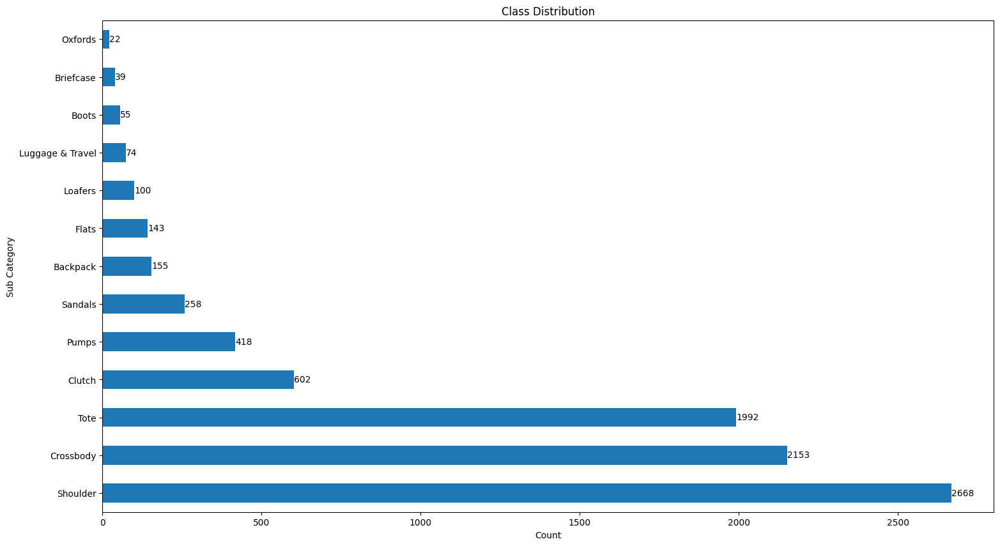

In [ ]:
# Calculate class distribution
class_distribution = df['Sub_Category'].value_counts()

# Create a horizontal bar chart
plt.figure(figsize=(18, 10))
ax = class_distribution.plot(kind='barh')
ax.bar_label(ax.containers[0])
plt.xlabel('Count')
plt.ylabel('Sub Category')
plt.title('Class Distribution')
plt.show()

Based on the bar chart above, the class distribution is imbalance, sub-category shoulder has the biggest number of data among the others.

### **Picture Sampling**

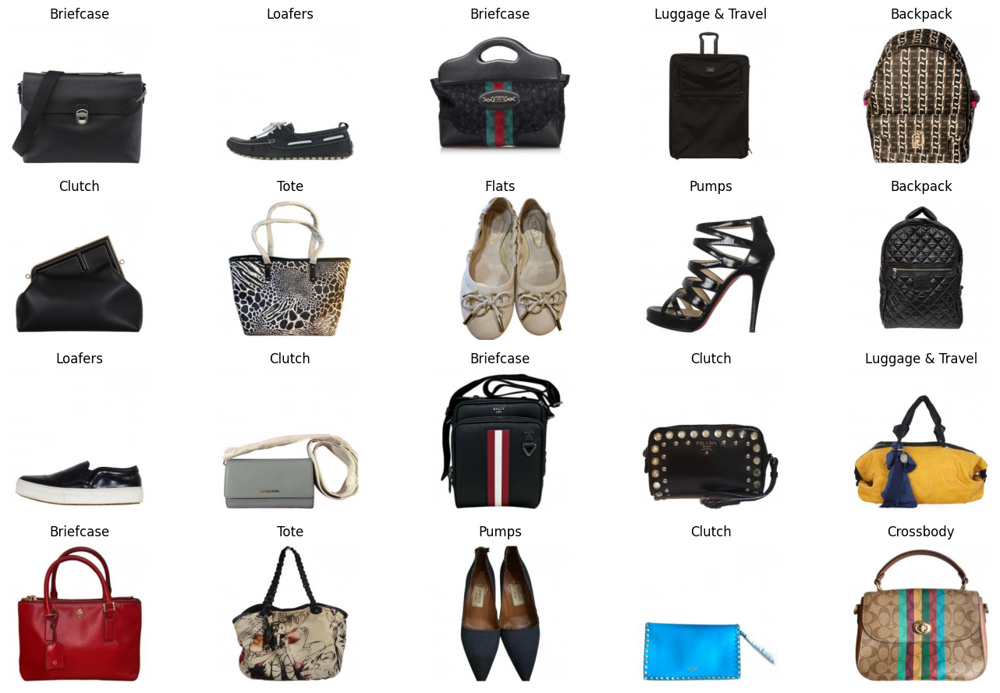

In [ ]:
# Select up to 20 random sub-categories with possible duplicates
num_sub_categories = min(20, len(df['Sub_Category'].unique()))
random_sub_categories = random.choices(df['Sub_Category'].unique().tolist(), k=20)

# Create a subplot with 4 rows and 5 columns
fig, axes = plt.subplots(4, 5, figsize=(14, 9))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over the axes and plot images from the randomly selected sub-categories
for i, ax in enumerate(axes):
    sub_category = random_sub_categories[i]
    sub_df = df[df['Sub_Category'] == sub_category]
    sample_row = sub_df.sample(1)
    image_path = sample_row['photo_path'].values[0]
    image = plt.imread(image_path)
    ax.imshow(image)
    ax.set_title(sub_category)
    ax.axis('off')

plt.tight_layout()
plt.show()

Checking sample dataset whether there is some mistake for the given name of sub-category

## **Data Processing**

### **Train-Test Splitting**

In [ ]:
# Define the number of rows for training
train_size = int(len(df)*0.9)

# Split the DataFrame into training and test sets
Train = df.iloc[:train_size]
Test = df.iloc[train_size:]

In [ ]:
print('training images:', Train.shape)
print('testing images:', Test.shape)

training images: (7811, 3)
testing images: (868, 3)


### **Noise Addition**

In [ ]:
# # Define the noise function
# def add_noise(image):
#     # Add Gaussian noise to the image
#     noise = np.random.normal(loc=0, scale=1, size=image.shape)
#     noisy_image = image + noise
#     # Clip the image to ensure pixel values are between 0 and 255
#     noisy_image = np.clip(noisy_image, 0, 255)
#     return noisy_image

### **Data Augmentation**

In [ ]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 500

# Create separate generators for training and testing
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,  # Randomly zoom by up to 20%
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.5, 1.5],  # Randomly brighten or darken images
    channel_shift_range=20  # Randomly shift the color channels
    # preprocessing_function=add_noise  # Apply the noise function
)

test_datagen = ImageDataGenerator()

# Flow training images in batches using train_datagen generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=Train,
    x_col='photo_path',
    y_col='Sub_Category',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Flow validation images in batches using test_datagen generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=Test,
    x_col='photo_path',
    y_col='Sub_Category',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

Found 7811 validated image filenames belonging to 13 classes.
Found 868 validated image filenames belonging to 12 classes.


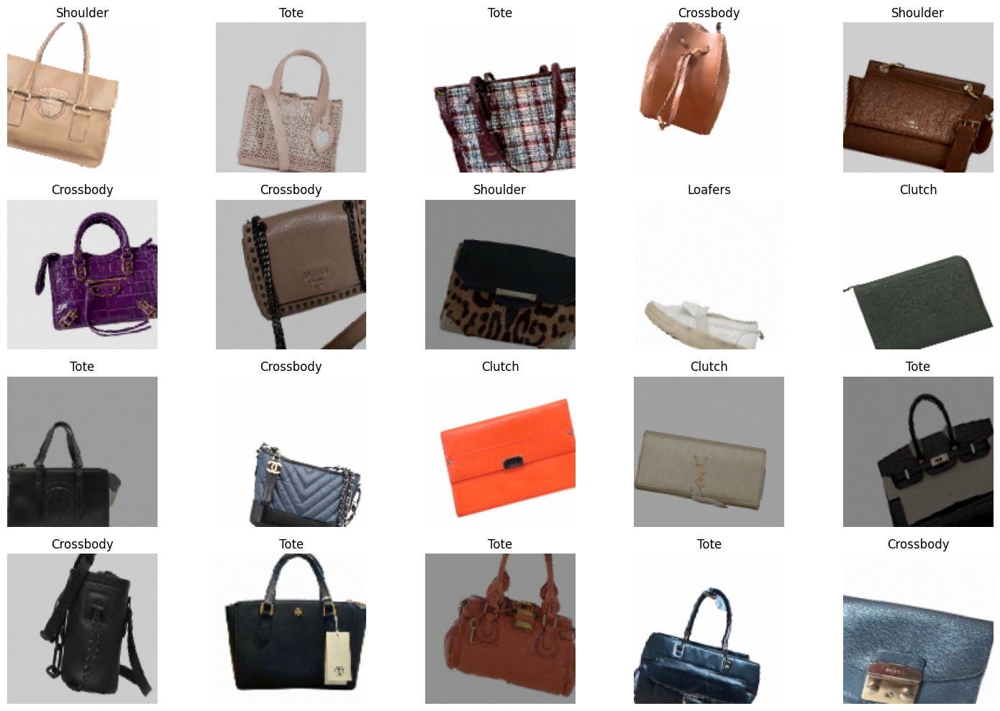

In [ ]:
# Generate a batch of augmented images and labels
augmented_images, augmented_labels = train_generator.next()

# Get the class indices from the generator
class_indices = train_generator.class_indices

# Reverse the dictionary to map indices to class labels
reverse_class_indices = {v: k for k, v in class_indices.items()}

# Plot the augmented images along with their labels
plt.figure(figsize=(15, 10))
for i in range(min(BATCH_SIZE, 20)):  # Use min to ensure the loop doesn't exceed 20
    plt.subplot(4, 5, i+1)
    plt.imshow(augmented_images[i] / 255.0)
    label_index = np.argmax(augmented_labels[i])
    class_label = reverse_class_indices[label_index]
    plt.title(class_label)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
print("Updated Image Shape: {}".format(train_generator.image_shape))
print("Updated Image Shape: {}".format(test_generator.image_shape))

Updated Image Shape: (128, 128, 3)
Updated Image Shape: (128, 128, 3)


## **Model Initiating - CNN**

In [ ]:
def create_model(num_classes):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(128, 128, 3)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())

    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))

    model.add(Dense(units=num_classes, activation='softmax'))

    return model

num_classes = len(Train['Sub_Category'].unique())

# Create model
model = create_model(num_classes)

# Use Learning Rate Scheduler
def lr_scheduler(epoch, lr):
    if epoch % 10 == 0 and epoch > 0:
        return lr * 0.9
    return lr

lr_schedule = LearningRateScheduler(lr_scheduler)

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 126, 126, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 63, 63, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 batch_normalization_1 (Bat  (None, 61, 61, 64)        2

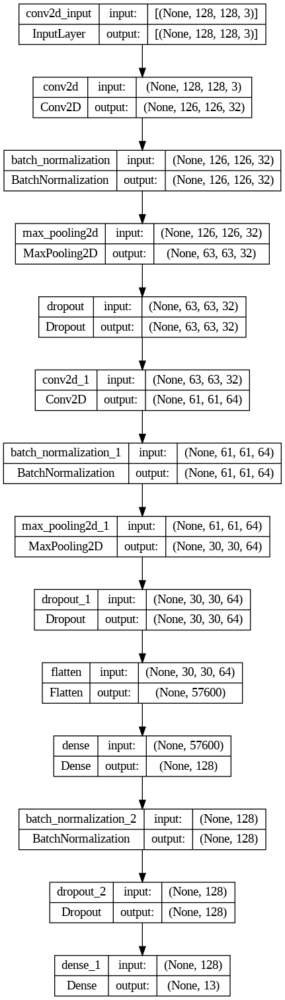

In [ ]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

### **Compile Model**

In [ ]:
# Compile model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

### **Label Encoder**

In [ ]:
# Initiate LabelEncoder
label_encoder = LabelEncoder()

Train['Sub_Category'] = label_encoder.fit_transform(Train['Sub_Category'])
Test['Sub_Category'] = label_encoder.fit_transform(Test['Sub_Category'])

<ipython-input-23-37cbe6ba7f06>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Train['Sub_Category'] = label_encoder.fit_transform(Train['Sub_Category'])
<ipython-input-23-37cbe6ba7f06>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Test['Sub_Category'] = label_encoder.fit_transform(Test['Sub_Category'])


['label_encoder.pkl']

In [ ]:
EPOCHS = 20
BATCH_SIZE = 100

In [ ]:
# Convert X_train and y_train to np.array form
X_train, y_train = train_generator.next()
X_test, y_test = test_generator.next()

# Convert X_train and X_test to float32
X_train = X_train.astype(np.float32) / 255.0
X_test = X_test.astype(np.float32) / 255.0

# Convert labels to one-hot encoded form
y_train = to_categorical(np.argmax(y_train, axis=1), num_classes=num_classes)
y_test = to_categorical(np.argmax(y_test, axis=1), num_classes=num_classes)

In [ ]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (500, 128, 128, 3)
y_train shape: (500, 13)
X_test shape: (500, 128, 128, 3)
y_test shape: (500, 13)


In [ ]:
train_generator = ImageDataGenerator().flow(X_train, y_train, batch_size=BATCH_SIZE)
test_generator = ImageDataGenerator().flow(X_test, y_test, batch_size=BATCH_SIZE)

In [ ]:
steps_per_epoch = X_train.shape[0]//BATCH_SIZE
test_per_epoch = X_test.shape[0]//BATCH_SIZE

In [ ]:
X_train.shape[0]

500

In [ ]:
# Calculate class weights
class_weights = compute_class_weight('balanced', np.unique(Train['Sub_Category']), Train['Sub_Category'])

# Create a dictionary mapping the class indices to their respective weights
class_weight_dict = dict(enumerate(class_weights))

print("Class weights:", class_weight_dict)

## **Model Fitting**

In [ ]:
tensorboard = TensorBoard(log_dir="/content/Sub_Category_Recognition/{}".
                          format(datetime.now(pytz.timezone('Asia/Jakarta')).strftime('%d-%b-%Y %H:%M')))

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)

history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                    validation_data=test_generator, validation_steps=test_per_epoch,
                    shuffle=True, callbacks=[tensorboard, early_stopping],
                    class_weight=class_weight_dict)

Epoch 1/20
5/5 [==============================] - 11s 253ms/step - loss: 3.8715 - accuracy: 0.1120 - val_loss: 2.7237 - val_accuracy: 0.2740
Epoch 2/20
5/5 [==============================] - 1s 141ms/step - loss: 3.0482 - accuracy: 0.2100 - val_loss: 2.3255 - val_accuracy: 0.3120
Epoch 3/20
5/5 [==============================] - 1s 138ms/step - loss: 2.5927 - accuracy: 0.2440 - val_loss: 2.3427 - val_accuracy: 0.2560
Epoch 4/20
5/5 [==============================] - 1s 178ms/step - loss: 2.4549 - accuracy: 0.2680 - val_loss: 2.3134 - val_accuracy: 0.2540
Epoch 5/20
5/5 [==============================] - 1s 141ms/step - loss: 2.2439 - accuracy: 0.3700 - val_loss: 2.3366 - val_accuracy: 0.2500
Epoch 6/20
5/5 [==============================] - 1s 138ms/step - loss: 2.0592 - accuracy: 0.4060 - val_loss: 2.3132 - val_accuracy: 0.2080
Epoch 7/20
5/5 [==============================] - 1s 145ms/step - loss: 1.6487 - accuracy: 0.5100 - val_loss: 2.3089 - val_accuracy: 0.2300
Epoch 8/20
5/5 [===

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir "/content/Sub_Category_Recognition/"

<IPython.core.display.Javascript object>

## **Visualize Performance**

In [ ]:
def plot_loss(history):
    plt.style.use("ggplot")
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title("Model's loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()


def plot_accuracy(history):
    plt.style.use("ggplot")
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title("Model's accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Accuracy")
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

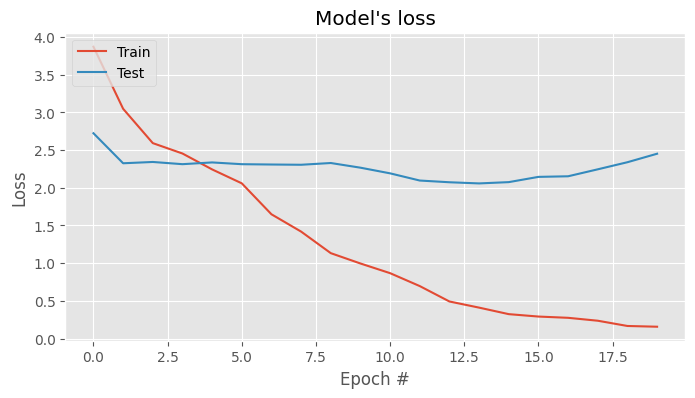

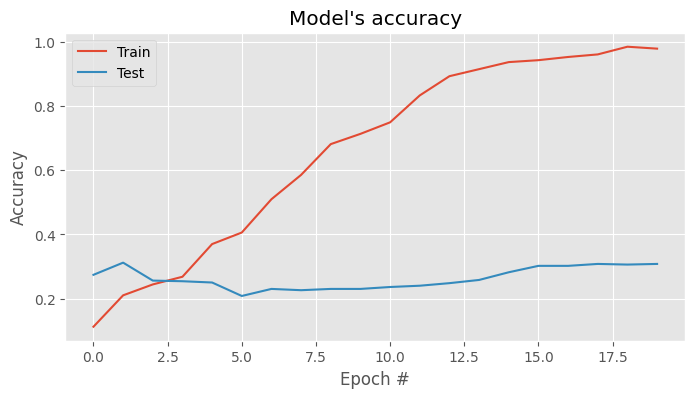

In [ ]:
plot_loss(history)
plot_accuracy(history)

## **Saving the Model**

In [ ]:
# Save the model architecture as JSON
model_json = model.to_json()
with open("sub_category_model.json", "w") as json_file:
    json_file.write(model_json)

# Save the model weights
model.save_weights("sub_category_model.h5")

# Download the model files
files.download("sub_category_model.json")
files.download("sub_category_model.h5")

# Save the label encoder
joblib.dump(label_encoder, 'label_encoder.pkl')
files.download('label_encoder.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **Load the Model**

In [ ]:
json_file = open('sub_category_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# Load weights into loaded model:
loaded_model.load_weights("sub_category_model.h5")
print("Model loaded from disk.")

# Load the LabelEncoder object
label_encoder = joblib.load('label_encoder.pkl')

Model loaded from disk.


## **Trial the Model with Un-seen Data**

In [ ]:
# Load the image
img_path = '/content/1product-I20919B00017M1131742-Xms-2023-10-30T1041390700.jpeg'

# Read the image in grayscale
image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Convert the grayscale image to a 3-channel image
image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

# Resize the image to (128, 128) if needed
resized_image_rgb = cv2.resize(image_rgb, (128, 128))

# Add a batch dimension
reshaped_image_rgb = resized_image_rgb[np.newaxis, :, :, :]

# Make predictions
predictions = loaded_model.predict(reshaped_image_rgb)

# Assuming your model outputs probabilities for each class (use argmax to get the predicted class)
predicted_label = np.argmax(predictions, axis=1)

label_encoder = joblib.load('label_encoder.pkl')

# Display or use the predicted label as needed
print(f"Predicted Label:", label_encoder.inverse_transform(predicted_label), "Label Number: ", predicted_label)

1/1 [==============================] - 0s 322ms/step
Predicted Label: ['Clutch'] Label Number:  [3]
